HW 3: Pipeline Improvement and Empirical Comparisons  
====
By Zhuo Leng
====






improvement:
--------------

1.Preprocess step: fill number of dependence with the median instead of since it is categorical and discrete

2.Feature generation step: include the results of my discretization and binarization into the features of my model

3.Add classifers and evaluation step

step 1: read data
------

In [3]:
#import read.py
import read

In [4]:
df = read.read_data('credit-data.csv')
df.head()

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,60644,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,60637,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,60601,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,60601,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,60625,1,0.024926,63588.0,7,0,1,0,0.0


step 2: explore data
------

In [8]:
#import explore.py
%matplotlib inline 
import explore

In [16]:
df.describe()

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,75000.500000,0.066840,6.048438,52.295207,60648.810013,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,43301.414527,0.249746,249.755371,14.771866,56.748197,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,1.000000,0.000000,0.000000,0.000000,60601.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37500.750000,0.000000,0.029867,41.000000,60625.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,75000.500000,0.000000,0.154181,52.000000,60629.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,112500.250000,0.000000,0.559046,63.000000,60644.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,150000.000000,1.000000,50708.000000,109.000000,60804.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [17]:
explore.number_count(df, 'NumberOfDependents')

0.0    86902
1.0    26316
2.0    19522
3.0     9483
4.0     2862
5.0      746
6.0      158
7.0       51
8.0       24
9.0        5
Name: NumberOfDependents, dtype: int64

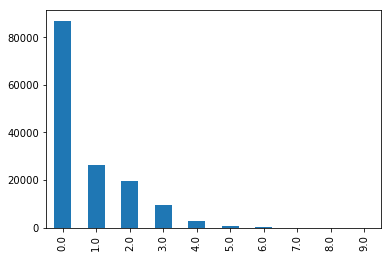

In [18]:
pd.value_counts(df.NumberOfDependents, ascending=False).head(10).plot(kind = 'bar')

From the top 10 number acount of NumberOfDependents, we could know more than 1/2 of family has 0.0 number of dependents in family excluding themselves(spouse, children etc.). They life on their own.Number of dependents in family excluding themselves (spouse, children etc.)

In [19]:
explore.number_count(df, 'age')

49    3837
48    3806
50    3753
63    3719
47    3719
46    3714
53    3648
51    3627
52    3609
56    3589
Name: age, dtype: int64

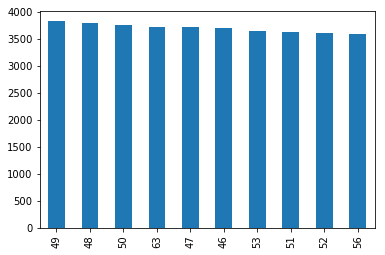

In [20]:
pd.value_counts(df.age, ascending=False).head(10).plot(kind = 'bar')

From the top 10 number acount of age, we could know the age of people don't different a lot. Most people are at the age of 49. 


In [21]:
explore.number_count(df, 'zipcode')

60625    33514
60629    16840
60637    16625
60657    16624
60618    16612
60804    16605
60601    16599
60644    16581
Name: zipcode, dtype: int64

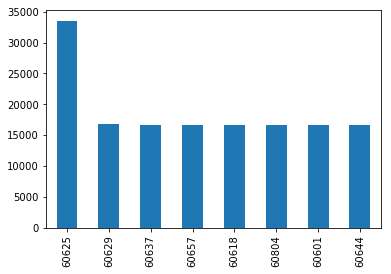

In [22]:
pd.value_counts(df.zipcode, ascending=False).plot(kind = 'bar')

Take a look at zipcode varibale, most people live in zipcode area 60625.

cross tab


In [23]:
explore.crosstable(df, 'NumberOfTimes90DaysLate', 'SeriousDlqin2yrs')

SeriousDlqin2yrs,0,1
NumberOfTimes90DaysLate,,
0,135108,6554
1,3478,1765
2,779,776
3,282,385
4,96,195
5,48,83
6,32,48
7,7,31
8,6,15


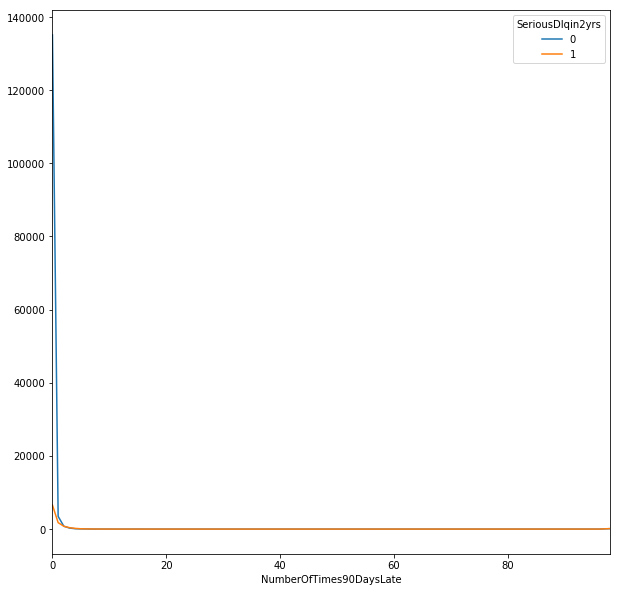

In [203]:
pd.crosstab(df.NumberOfTimes90DaysLate, df.SeriousDlqin2yrs).plot(figsize=(10,10))

From the cross table of NumberOfTimes90DaysLate and SeriousDlqin2yrs, most people experienced 90 days past due delinquency or worse have more number of times borrower has been 90 days or more past due. People do not experienced 90 days past due delinquency or worse have less number of times borrower has been 90 days or more past due.

In [25]:
pd.crosstab(df.age, df.NumberOfDependents)


NumberOfDependents,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,13.0,20.0
age,,,,,,,,,,,,,
0,0,0,1,0,0,0,0,0,0,0,0,0,0
21,148,3,1,0,0,0,0,0,0,0,0,0,0
22,385,7,2,2,0,0,0,0,0,0,0,0,0
23,550,33,13,3,0,0,0,0,0,0,0,0,0
24,689,48,19,3,1,0,0,0,0,0,0,0,0
25,774,91,31,7,5,1,0,0,0,0,0,0,0
26,946,128,56,14,4,0,0,0,0,0,0,0,0
27,1001,192,53,32,4,0,0,0,0,0,0,0,0
28,1142,210,114,45,8,1,0,0,0,0,0,0,0


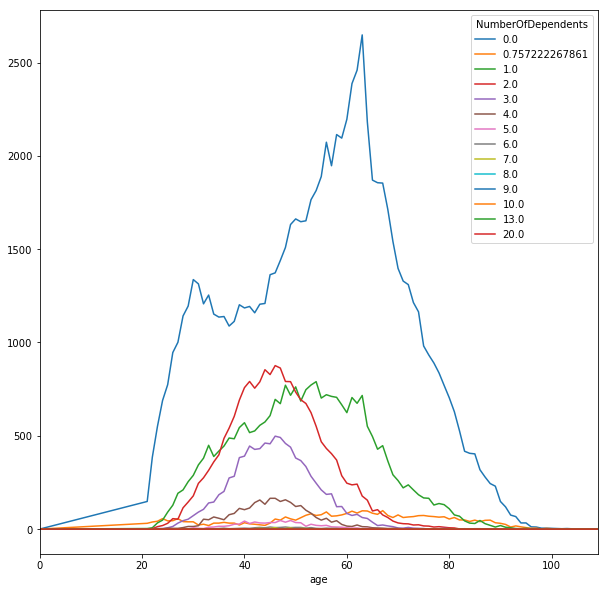

In [202]:
pd.crosstab(df.age, df.NumberOfDependents).plot(figsize=(10,10))

From the cross table of age and NumberOfDependents, most people have 9 number of dependents in family excluding themselves (spouse, children etc.). Also, we could know, with the increase of ages, number of dependents in family excluding themselves (spouse, children etc.) will increase. However, when after age 40-60, number of dependents in family excluding themselves (spouse, children etc.) will decrease.


step 3: pre-processing data: handing missing value
------

In [18]:
#import PreProcess.py
import PreProcess

In [19]:
df_lng = pd.melt(df)
df_lng.head()

,variable,value
0,PersonID,1.0
1,PersonID,2.0
2,PersonID,3.0
3,PersonID,4.0
4,PersonID,5.0


In [12]:
PreProcess.print_null_freq(df)

value,False,True
variable,,
DebtRatio,150000,0
MonthlyIncome,120269,29731
NumberOfDependents,146076,3924
NumberOfOpenCreditLinesAndLoans,150000,0
NumberOfTime30-59DaysPastDueNotWorse,150000,0
NumberOfTime60-89DaysPastDueNotWorse,150000,0
NumberOfTimes90DaysLate,150000,0
NumberRealEstateLoansOrLines,150000,0
PersonID,150000,0


From the crosstable table, we could know that MonthlyIncome and NumberOfDependents are two variables with missing value. We need to fill them with mean value.

In [13]:
df.MonthlyIncome.describe()

count    1.202690e+05
mean     6.670221e+03
std      1.438467e+04
min      0.000000e+00
25%      3.400000e+03
50%      5.400000e+03
75%      8.249000e+03
max      3.008750e+06
Name: MonthlyIncome, dtype: float64

In [21]:
#fill MonthlyIncome na with mean
PreProcess.fill_na('mean',df,'MonthlyIncome')

0          9120.000000
1          2600.000000
2          3042.000000
3          3300.000000
4         63588.000000
5          3500.000000
6          6670.221237
7          3500.000000
8          6670.221237
9         23684.000000
10         2500.000000
11         6501.000000
12        12454.000000
13        13700.000000
14            0.000000
15        11362.000000
16         6670.221237
17         8800.000000
18         3280.000000
19          333.000000
20        12300.000000
21         3000.000000
22         2500.000000
23         7916.000000
24         2416.000000
25         4676.000000
26         8333.000000
27         2500.000000
28         3400.000000
29         5500.000000
              ...     
149970    15500.000000
149971     5000.000000
149972     6945.000000
149973     5500.000000
149974     5000.000000
149975     6670.221237
149976     6670.221237
149977     6670.221237
149978     2500.000000
149979     8700.000000
149980     5525.000000
149981     6849.000000
149982     

In [22]:
df.NumberOfDependents.describe()

count    146076.000000
mean          0.757222
std           1.115086
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          20.000000
Name: NumberOfDependents, dtype: float64

*improvement1
----


In [23]:
#fill MonthlyIncome na with median
PreProcess.fill_na('median',df,'NumberOfDependents')

0         2.0
1         1.0
2         0.0
3         0.0
4         0.0
5         1.0
6         0.0
7         0.0
8         0.0
9         2.0
10        0.0
11        2.0
12        2.0
13        2.0
14        0.0
15        2.0
16        0.0
17        0.0
18        2.0
19        0.0
20        0.0
21        2.0
22        0.0
23        0.0
24        0.0
25        1.0
26        0.0
27        1.0
28        0.0
29        0.0
         ... 
149970    2.0
149971    0.0
149972    1.0
149973    1.0
149974    0.0
149975    0.0
149976    0.0
149977    0.0
149978    0.0
149979    0.0
149980    0.0
149981    4.0
149982    3.0
149983    0.0
149984    0.0
149985    0.0
149986    1.0
149987    0.0
149988    0.0
149989    3.0
149990    2.0
149991    0.0
149992    3.0
149993    0.0
149994    0.0
149995    0.0
149996    2.0
149997    0.0
149998    0.0
149999    0.0
Name: NumberOfDependents, dtype: float64

In [24]:
#check again for null value by using cross table
PreProcess.print_null_freq(df)


value,False
variable,
DebtRatio,150000
MonthlyIncome,150000
NumberOfDependents,150000
NumberOfOpenCreditLinesAndLoans,150000
NumberOfTime30-59DaysPastDueNotWorse,150000
NumberOfTime60-89DaysPastDueNotWorse,150000
NumberOfTimes90DaysLate,150000
NumberRealEstateLoansOrLines,150000
PersonID,150000


Now all the variables have 150000 number of no-null value. So we successfully fill the missing value with mean of relavent variables. After clean the data, we need to yield a new csv.

In [25]:
df.to_csv("credit-data-post-import.csv", index=False)


step 4: Generate Features/Predictors
----------

In [26]:
#import feature.py
import feature
df.head()

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,60644,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,60637,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,60601,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,60601,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,60625,1,0.024926,63588.0,7,0,1,0,0.0


In [53]:
#categorical features
#SeriousDlqin2yrs

df['SeriousDlqin2yrs_False'] = feature.categorical_var(df,'SeriousDlqin2yrs')[0]
df['SeriousDlqin2yrs_True'] = feature.categorical_var(df,'SeriousDlqin2yrs')[1]
feature.categorical_var(df,'SeriousDlqin2yrs')

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs_0,SeriousDlqin2yrs_1
0,1,1,0.766127,45,60644,2,0.802982,9120.000000,13,0,6,0,2.0,0,1
1,2,0,0.957151,40,60637,0,0.121876,2600.000000,4,0,0,0,1.0,1,0
2,3,0,0.658180,38,60601,1,0.085113,3042.000000,2,1,0,0,0.0,1,0
3,4,0,0.233810,30,60601,0,0.036050,3300.000000,5,0,0,0,0.0,1,0
4,5,0,0.907239,49,60625,1,0.024926,63588.000000,7,0,1,0,0.0,1,0
5,6,0,0.213179,74,60629,0,0.375607,3500.000000,3,0,1,0,1.0,1,0
6,7,0,0.305682,57,60637,0,5710.000000,6670.221237,8,0,3,0,0.0,1,0
7,8,0,0.754464,39,60625,0,0.209940,3500.000000,8,0,0,0,0.0,1,0
8,9,0,0.116951,27,60804,0,46.000000,6670.221237,2,0,0,0,0.0,1,0
9,10,0,0.189169,57,60629,0,0.606291,23684.000000,9,0,4,0,2.0,1,0


In [78]:
#discretize continuous variables
#RevolvingUtilizationOfUnsecuredLines
max(df['RevolvingUtilizationOfUnsecuredLines']) - min(df['RevolvingUtilizationOfUnsecuredLines'])

50708.0

In [54]:
#because max-min (RevolvingUtilizationOfUnsecuredLines) = 50708, so we choose bin = 100
df['RevolvingUtilizationOfUnsecuredLines_dis'] = feature.discretize_continuous_var(df,'RevolvingUtilizationOfUnsecuredLines', 100)
df['RevolvingUtilizationOfUnsecuredLines_dis']

0         (-50.708, 507.08]
1         (-50.708, 507.08]
2         (-50.708, 507.08]
3         (-50.708, 507.08]
4         (-50.708, 507.08]
5         (-50.708, 507.08]
6         (-50.708, 507.08]
7         (-50.708, 507.08]
8         (-50.708, 507.08]
9         (-50.708, 507.08]
10        (-50.708, 507.08]
11        (-50.708, 507.08]
12        (-50.708, 507.08]
13        (-50.708, 507.08]
14        (-50.708, 507.08]
15        (-50.708, 507.08]
16        (-50.708, 507.08]
17        (-50.708, 507.08]
18        (-50.708, 507.08]
19        (-50.708, 507.08]
20        (-50.708, 507.08]
21        (-50.708, 507.08]
22        (-50.708, 507.08]
23        (-50.708, 507.08]
24        (-50.708, 507.08]
25        (-50.708, 507.08]
26        (-50.708, 507.08]
27        (-50.708, 507.08]
28        (-50.708, 507.08]
29        (-50.708, 507.08]
                ...        
149970    (-50.708, 507.08]
149971    (-50.708, 507.08]
149972    (-50.708, 507.08]
149973    (-50.708, 507.08]
149974    (-50.708, 

In [75]:
#discretize continuous variables
#age
max(df['age']) - min(df['age'])


109

In [82]:
#because age varibale (max-min) =109, we choose bins = 5
df['age_dis'] = feature.discretize_continuous_var(df,'age', 5)
df['age_dis']
#in order to use age as our feature , we still need to transfer it to dummy variables
age = feature.categorical_var(df,'age_dis')
df


,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,...,NumberOfDependents_8.0,NumberOfDependents_9.0,NumberOfDependents_10.0,NumberOfDependents_13.0,NumberOfDependents_20.0,"age_dis_(-0.109, 21.8]","age_dis_(21.8, 43.6]","age_dis_(43.6, 65.4]","age_dis_(65.4, 87.2]","age_dis_(87.2, 109]"
0,1,1,0.766127,45,60644,2,0.802982,9120.000000,13,0,...,0,0,0,0,0,0,0,1,0,0
1,2,0,0.957151,40,60637,0,0.121876,2600.000000,4,0,...,0,0,0,0,0,0,1,0,0,0
2,3,0,0.658180,38,60601,1,0.085113,3042.000000,2,1,...,0,0,0,0,0,0,1,0,0,0
3,4,0,0.233810,30,60601,0,0.036050,3300.000000,5,0,...,0,0,0,0,0,0,1,0,0,0
4,5,0,0.907239,49,60625,1,0.024926,63588.000000,7,0,...,0,0,0,0,0,0,0,1,0,0
5,6,0,0.213179,74,60629,0,0.375607,3500.000000,3,0,...,0,0,0,0,0,0,0,0,1,0
6,7,0,0.305682,57,60637,0,5710.000000,6670.221237,8,0,...,0,0,0,0,0,0,0,1,0,0
7,8,0,0.754464,39,60625,0,0.209940,3500.000000,8,0,...,0,0,0,0,0,0,1,0,0,0
8,9,0,0.116951,27,60804,0,46.000000,6670.221237,2,0,...,0,0,0,0,0,0,1,0,0,0
9,10,0,0.189169,57,60629,0,0.606291,23684.000000,9,0,...,0,0,0,0,0,0,0,1,0,0


In [56]:
#categorical features
#zipcode
zip = feature.categorical_var(df,'zipcode')
zip

,zipcode_60601,zipcode_60618,zipcode_60625,zipcode_60629,zipcode_60637,zipcode_60644,zipcode_60657,zipcode_60804
0,0,0,0,0,0,1,0,0
1,0,0,0,0,1,0,0,0
2,1,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0
5,0,0,0,1,0,0,0,0
6,0,0,0,0,1,0,0,0
7,0,0,1,0,0,0,0,0
8,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0


In [58]:
df['zip_60601'] = zip.iloc[:,0]
df['zip_60618'] = zip.iloc[:,1]
df['zip_60625'] = zip.iloc[:,2]
df['zip_60629'] = zip.iloc[:,3]
df['zip_60637'] = zip.iloc[:,4]
df['zip_60644'] = zip.iloc[:,5]
df['zip_60657'] = zip.iloc[:,6]
df['zip_60804'] = zip.iloc[:,7]

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,...,RevolvingUtilizationOfUnsecuredLines_dis,age_dis,zip_60601,zip_60618,zip_60625,zip_60629,zip_60637,zip_60644,zip_60657,zip_60804
0,1,1,0.766127,45,60644,2,0.802982,9120.000000,13,0,...,"(-50.708, 507.08]","(43.6, 49.05]",0,0,0,0,0,1,0,0
1,2,0,0.957151,40,60637,0,0.121876,2600.000000,4,0,...,"(-50.708, 507.08]","(38.15, 43.6]",0,0,0,0,1,0,0,0
2,3,0,0.658180,38,60601,1,0.085113,3042.000000,2,1,...,"(-50.708, 507.08]","(32.7, 38.15]",1,0,0,0,0,0,0,0
3,4,0,0.233810,30,60601,0,0.036050,3300.000000,5,0,...,"(-50.708, 507.08]","(27.25, 32.7]",1,0,0,0,0,0,0,0
4,5,0,0.907239,49,60625,1,0.024926,63588.000000,7,0,...,"(-50.708, 507.08]","(43.6, 49.05]",0,0,1,0,0,0,0,0
5,6,0,0.213179,74,60629,0,0.375607,3500.000000,3,0,...,"(-50.708, 507.08]","(70.85, 76.3]",0,0,0,1,0,0,0,0
6,7,0,0.305682,57,60637,0,5710.000000,6670.221237,8,0,...,"(-50.708, 507.08]","(54.5, 59.95]",0,0,0,0,1,0,0,0
7,8,0,0.754464,39,60625,0,0.209940,3500.000000,8,0,...,"(-50.708, 507.08]","(38.15, 43.6]",0,0,1,0,0,0,0,0
8,9,0,0.116951,27,60804,0,46.000000,6670.221237,2,0,...,"(-50.708, 507.08]","(21.8, 27.25]",0,0,0,0,0,0,0,1
9,10,0,0.189169,57,60629,0,0.606291,23684.000000,9,0,...,"(-50.708, 507.08]","(54.5, 59.95]",0,0,0,1,0,0,0,0


In [105]:
#categorical features
#NumberOfTime30-59DaysPastDueNotWorse
num = pd.get_dummies(df.iloc[:,5], prefix = 'NumberOfTime30-59DaysPastDueNotWorse')
num

,NumberOfTime30-59DaysPastDueNotWorse_0,NumberOfTime30-59DaysPastDueNotWorse_1,NumberOfTime30-59DaysPastDueNotWorse_2,NumberOfTime30-59DaysPastDueNotWorse_3,NumberOfTime30-59DaysPastDueNotWorse_4,NumberOfTime30-59DaysPastDueNotWorse_5,NumberOfTime30-59DaysPastDueNotWorse_6,NumberOfTime30-59DaysPastDueNotWorse_7,NumberOfTime30-59DaysPastDueNotWorse_8,NumberOfTime30-59DaysPastDueNotWorse_9,NumberOfTime30-59DaysPastDueNotWorse_10,NumberOfTime30-59DaysPastDueNotWorse_11,NumberOfTime30-59DaysPastDueNotWorse_12,NumberOfTime30-59DaysPastDueNotWorse_13,NumberOfTime30-59DaysPastDueNotWorse_96,NumberOfTime30-59DaysPastDueNotWorse_98
0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [114]:
#concat variables to df
df = pd.concat([df, num], axis=1)
df

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,...,NumberOfTime30-59DaysPastDueNotWorse_6,NumberOfTime30-59DaysPastDueNotWorse_7,NumberOfTime30-59DaysPastDueNotWorse_8,NumberOfTime30-59DaysPastDueNotWorse_9,NumberOfTime30-59DaysPastDueNotWorse_10,NumberOfTime30-59DaysPastDueNotWorse_11,NumberOfTime30-59DaysPastDueNotWorse_12,NumberOfTime30-59DaysPastDueNotWorse_13,NumberOfTime30-59DaysPastDueNotWorse_96,NumberOfTime30-59DaysPastDueNotWorse_98
0,1,1,0.766127,45,60644,2,0.802982,9120.000000,13,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0.957151,40,60637,0,0.121876,2600.000000,4,0,...,0,0,0,0,0,0,0,0,0,0
2,3,0,0.658180,38,60601,1,0.085113,3042.000000,2,1,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0.233810,30,60601,0,0.036050,3300.000000,5,0,...,0,0,0,0,0,0,0,0,0,0
4,5,0,0.907239,49,60625,1,0.024926,63588.000000,7,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,0.213179,74,60629,0,0.375607,3500.000000,3,0,...,0,0,0,0,0,0,0,0,0,0
6,7,0,0.305682,57,60637,0,5710.000000,6670.221237,8,0,...,0,0,0,0,0,0,0,0,0,0
7,8,0,0.754464,39,60625,0,0.209940,3500.000000,8,0,...,0,0,0,0,0,0,0,0,0,0
8,9,0,0.116951,27,60804,0,46.000000,6670.221237,2,0,...,0,0,0,0,0,0,0,0,0,0
9,10,0,0.189169,57,60629,0,0.606291,23684.000000,9,0,...,0,0,0,0,0,0,0,0,0,0


In [115]:
#discretize continuous variables
#DebtRatio
max(df['DebtRatio']) - min(df['DebtRatio'])

329664.0

In [76]:
#because age varibale (max-min) =329664, we choose bins = 100
df['DebtRatio_dis'] = feature.discretize_continuous_var(df,'age', 100)
df['age_dis']

0         (43.6, 49.05]
1         (38.15, 43.6]
2         (32.7, 38.15]
3         (27.25, 32.7]
4         (43.6, 49.05]
5         (70.85, 76.3]
6         (54.5, 59.95]
7         (38.15, 43.6]
8         (21.8, 27.25]
9         (54.5, 59.95]
10        (27.25, 32.7]
11        (49.05, 54.5]
12        (43.6, 49.05]
13        (38.15, 43.6]
14        (70.85, 76.3]
15        (59.95, 65.4]
16        (76.3, 81.75]
17        (49.05, 54.5]
18        (38.15, 43.6]
19        (21.8, 27.25]
20        (38.15, 43.6]
21        (32.7, 38.15]
22        (38.15, 43.6]
23        (27.25, 32.7]
24        (54.5, 59.95]
25        (49.05, 54.5]
26        (54.5, 59.95]
27        (65.4, 70.85]
28        (21.8, 27.25]
29        (54.5, 59.95]
              ...      
149970    (54.5, 59.95]
149971    (81.75, 87.2]
149972    (38.15, 43.6]
149973    (43.6, 49.05]
149974    (59.95, 65.4]
149975    (54.5, 59.95]
149976    (70.85, 76.3]
149977    (27.25, 32.7]
149978    (49.05, 54.5]
149979    (54.5, 59.95]
149980    (59.95

In [117]:
#discretize continuous variables
#MonthlyIncome
max(df['MonthlyIncome']) - min(df['MonthlyIncome'])

3008750.0

In [60]:
#because age varibale (max-min) =329664, we choose bins = 1000
df['MonthlyIncome_dis'] = feature.discretize_continuous_var(df,'MonthlyIncome', 1000)
df['MonthlyIncome_dis']

0            (9026.25, 12035]
1         (-3008.75, 3008.75]
2           (3008.75, 6017.5]
3           (3008.75, 6017.5]
4         (63183.75, 66192.5]
5           (3008.75, 6017.5]
6           (6017.5, 9026.25]
7           (3008.75, 6017.5]
8           (6017.5, 9026.25]
9           (21061.25, 24070]
10        (-3008.75, 3008.75]
11          (6017.5, 9026.25]
12          (12035, 15043.75]
13          (12035, 15043.75]
14        (-3008.75, 3008.75]
15           (9026.25, 12035]
16          (6017.5, 9026.25]
17          (6017.5, 9026.25]
18          (3008.75, 6017.5]
19        (-3008.75, 3008.75]
20          (12035, 15043.75]
21        (-3008.75, 3008.75]
22        (-3008.75, 3008.75]
23          (6017.5, 9026.25]
24        (-3008.75, 3008.75]
25          (3008.75, 6017.5]
26          (6017.5, 9026.25]
27        (-3008.75, 3008.75]
28          (3008.75, 6017.5]
29          (3008.75, 6017.5]
                 ...         
149970    (15043.75, 18052.5]
149971      (3008.75, 6017.5]
149972    

In [61]:
#categorical features
#NumberOfDependents
num = feature.categorical_var(df,'NumberOfDependents')
num

,NumberOfDependents_0.0,NumberOfDependents_1.0,NumberOfDependents_2.0,NumberOfDependents_3.0,NumberOfDependents_4.0,NumberOfDependents_5.0,NumberOfDependents_6.0,NumberOfDependents_7.0,NumberOfDependents_8.0,NumberOfDependents_9.0,NumberOfDependents_10.0,NumberOfDependents_13.0,NumberOfDependents_20.0
0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0,0,0,0,0


In [63]:
#concat variables to df
df = pd.concat([df, num], axis=1)
df

,PersonID,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,zipcode,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,...,NumberOfDependents_3.0,NumberOfDependents_4.0,NumberOfDependents_5.0,NumberOfDependents_6.0,NumberOfDependents_7.0,NumberOfDependents_8.0,NumberOfDependents_9.0,NumberOfDependents_10.0,NumberOfDependents_13.0,NumberOfDependents_20.0
0,1,1,0.766127,45,60644,2,0.802982,9120.000000,13,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0.957151,40,60637,0,0.121876,2600.000000,4,0,...,0,0,0,0,0,0,0,0,0,0
2,3,0,0.658180,38,60601,1,0.085113,3042.000000,2,1,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0.233810,30,60601,0,0.036050,3300.000000,5,0,...,0,0,0,0,0,0,0,0,0,0
4,5,0,0.907239,49,60625,1,0.024926,63588.000000,7,0,...,0,0,0,0,0,0,0,0,0,0
5,6,0,0.213179,74,60629,0,0.375607,3500.000000,3,0,...,0,0,0,0,0,0,0,0,0,0
6,7,0,0.305682,57,60637,0,5710.000000,6670.221237,8,0,...,0,0,0,0,0,0,0,0,0,0
7,8,0,0.754464,39,60625,0,0.209940,3500.000000,8,0,...,0,0,0,0,0,0,0,0,0,0
8,9,0,0.116951,27,60804,0,46.000000,6670.221237,2,0,...,0,0,0,0,0,0,0,0,0,0
9,10,0,0.189169,57,60629,0,0.606291,23684.000000,9,0,...,0,0,0,0,0,0,0,0,0,0


step 5: build classifier and evaluation
-------

The classifier I will use is Logistic Regression, K-Nearest Neighbor, Decision Trees, Random Forests, Boosting, and Bagging.

In [74]:
#import Classifer/Evaluation.py
import ClassifierEvaluation
import pandas as pd

In [67]:
NOTEBOOK = 1

In [83]:
df.columns

Index(['PersonID', 'SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines',
       'age', 'zipcode', 'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio',
       'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans',
       'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines',
       'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents',
       'SeriousDlqin2yrs_0', 'SeriousDlqin2yrs_1',
       'RevolvingUtilizationOfUnsecuredLines_dis', 'age_dis', 'zip_60601',
       'zip_60618', 'zip_60625', 'zip_60629', 'zip_60637', 'zip_60644',
       'zip_60657', 'zip_60804', 'DebtRatio_dis', 'MonthlyIncome_dis',
       'NumberOfDependents_0.0', 'NumberOfDependents_1.0',
       'NumberOfDependents_2.0', 'NumberOfDependents_3.0',
       'NumberOfDependents_4.0', 'NumberOfDependents_5.0',
       'NumberOfDependents_6.0', 'NumberOfDependents_7.0',
       'NumberOfDependents_8.0', 'NumberOfDependents_9.0',
       'NumberOfDependents_10.0', 'NumberOfDependents_13.0',
       'NumberOfDependen

improvement2: include the results of my discretization and binarization into the features of my model
---


I choose to use 'RevolvingUtilizationOfUnsecuredLines', numberofdependents, 'age', 'NumberOfTimes90DaysLate' as my features.

In [84]:
features  =  ['RevolvingUtilizationOfUnsecuredLines', 'NumberOfDependents_0.0', 'NumberOfDependents_1.0',
       'NumberOfDependents_2.0', 'NumberOfDependents_3.0',
       'NumberOfDependents_4.0', 'NumberOfDependents_5.0',
       'NumberOfDependents_6.0', 'NumberOfDependents_7.0',
       'NumberOfDependents_8.0', 'NumberOfDependents_9.0',
       'NumberOfDependents_10.0', 'NumberOfDependents_13.0',
       'NumberOfDependents_20.0','age_dis_(-0.109, 21.8]',
       'age_dis_(21.8, 43.6]', 'age_dis_(43.6, 65.4]', 'age_dis_(65.4, 87.2]',
       'age_dis_(87.2, 109]', 'NumberOfTimes90DaysLate']

RF


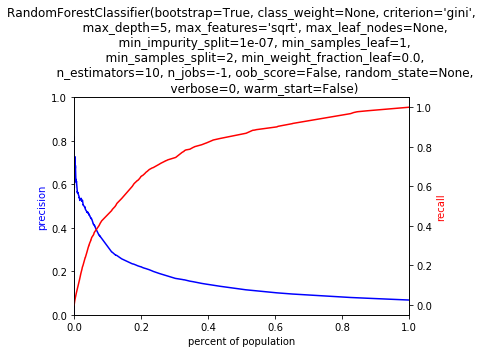

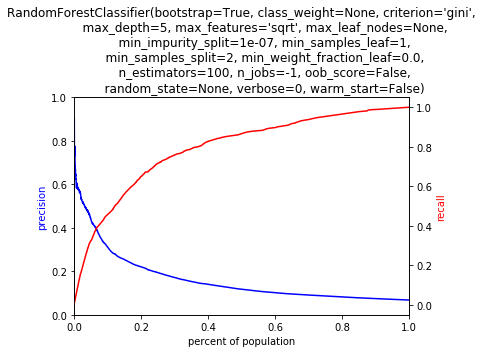

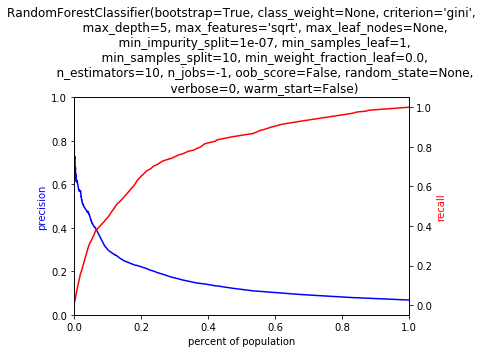

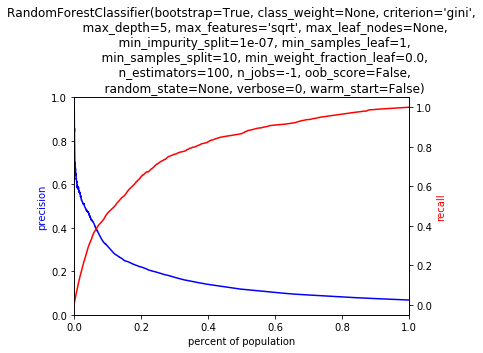

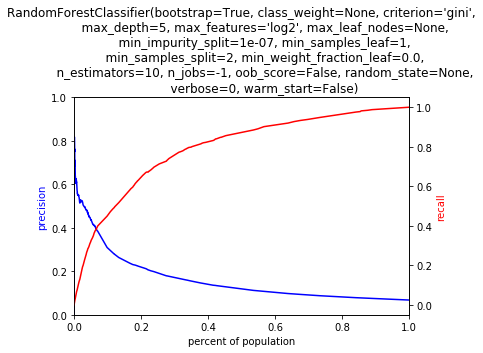

...

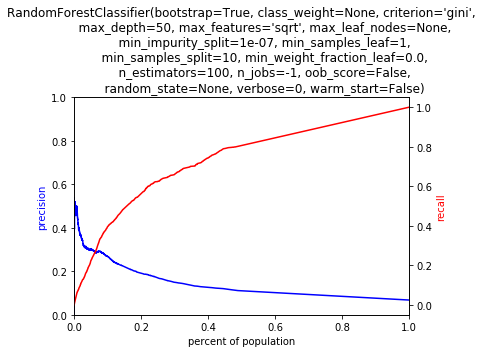

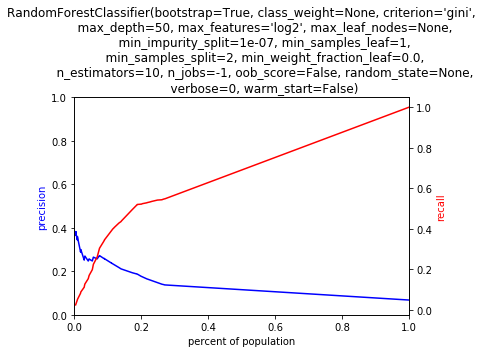

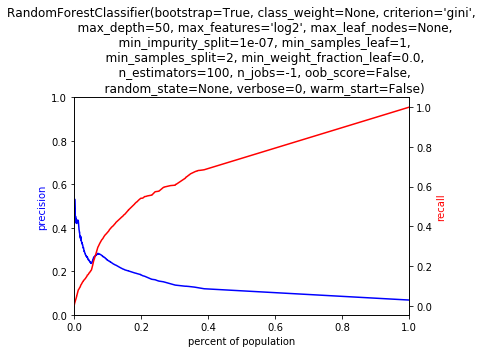

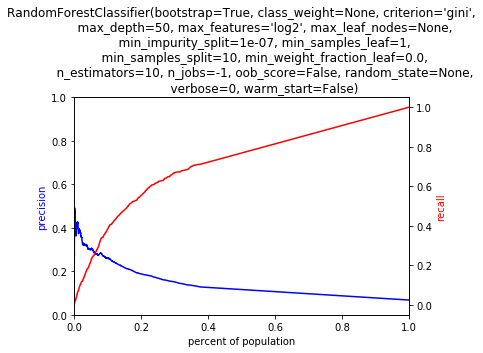

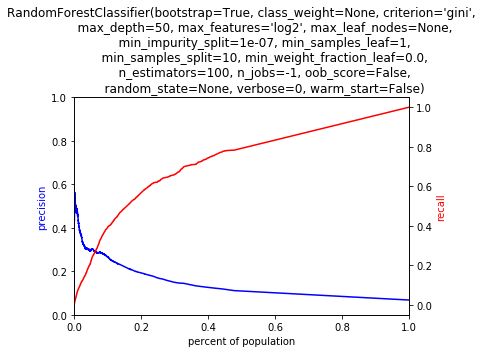

DT


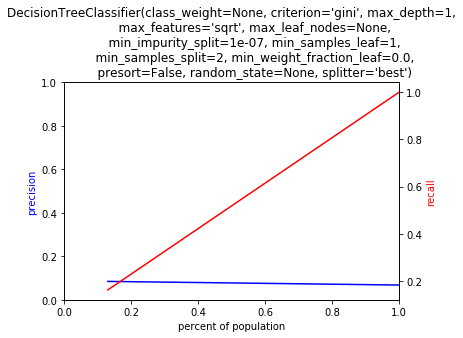

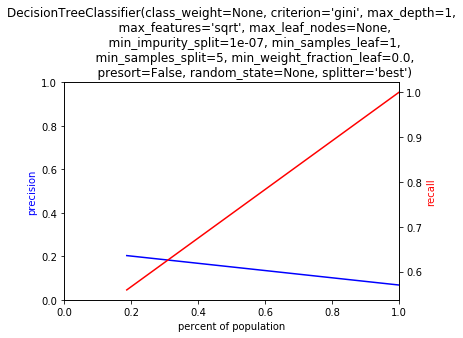

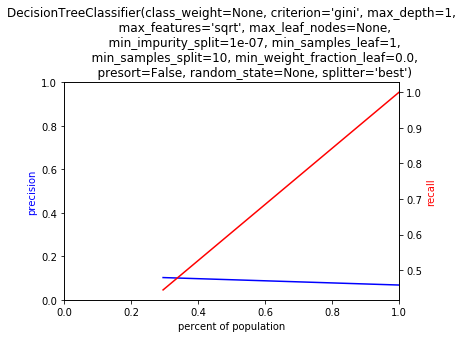

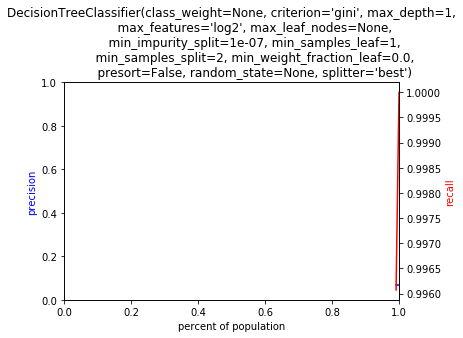

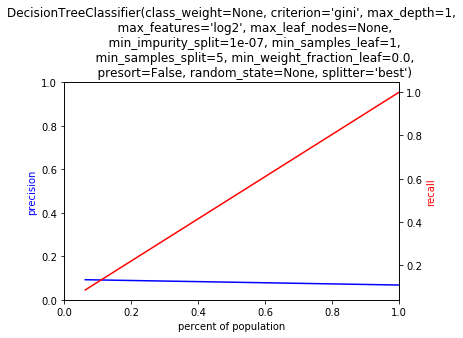

...

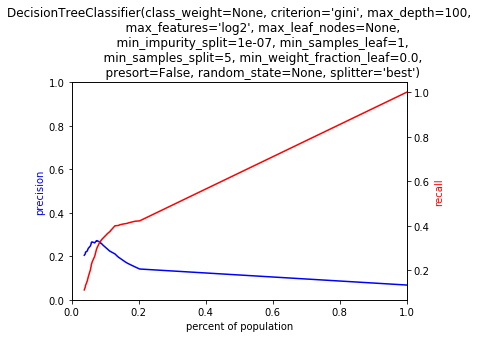

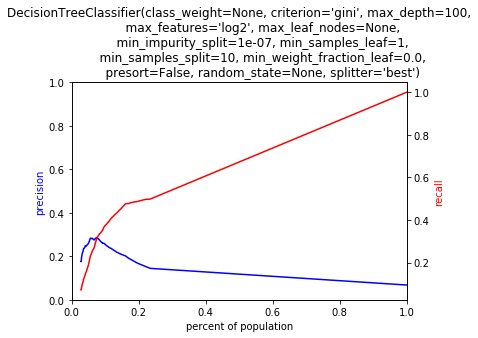

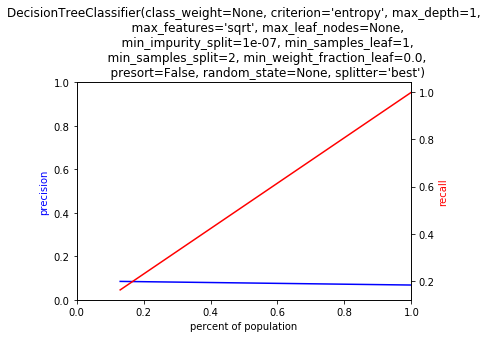

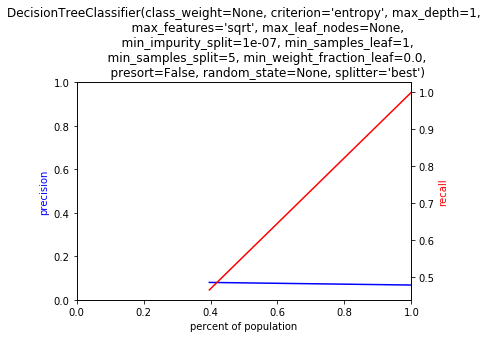

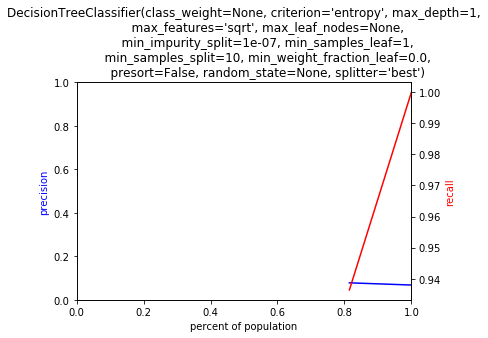

In [ ]:
grid_size = 'small'
clfs, grid = ClassifierEvaluation4.define_clfs_params(grid_size)
models_to_run=['RF','DT','KNN', 'ET', 'AB', 'GB', 'LR', 'NB']

X = df[features]
y = df.SeriousDlqin2yrs
results_df = ClassifierEvaluation6.clf_loop(models_to_run, clfs, grid, X,y)

RF


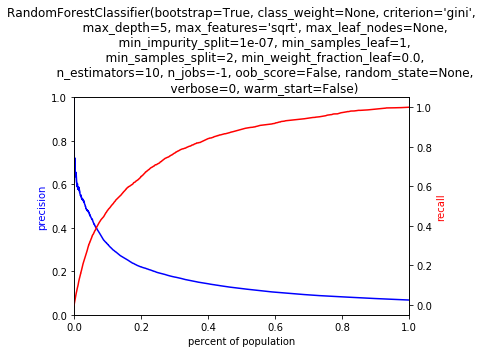

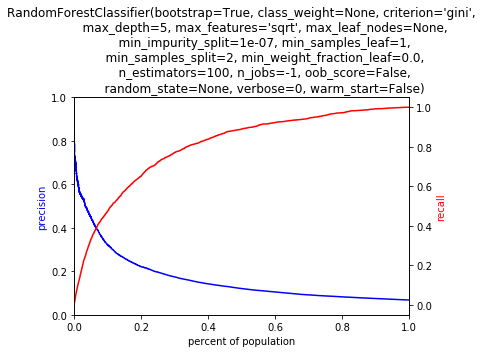

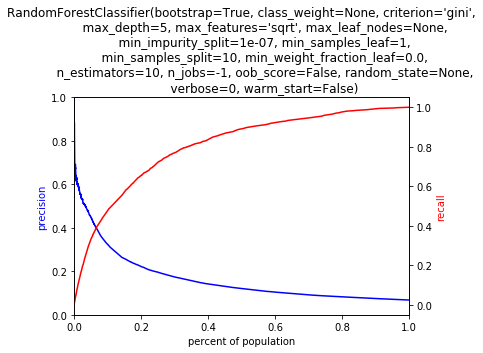

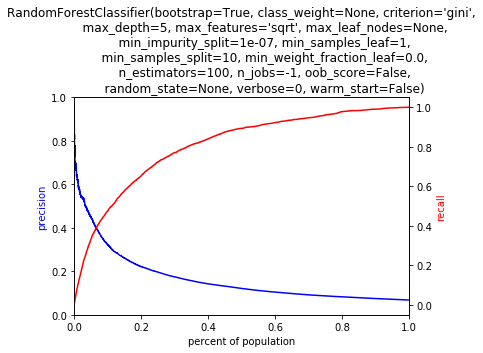

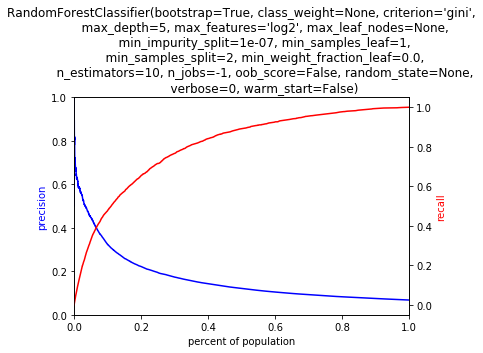

...

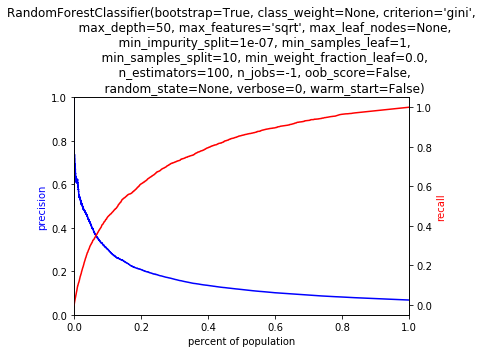

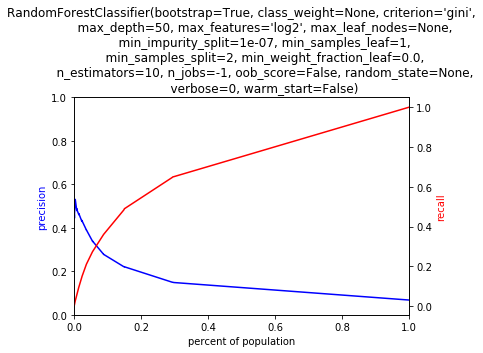

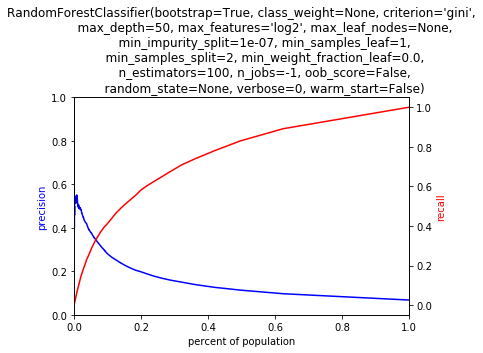

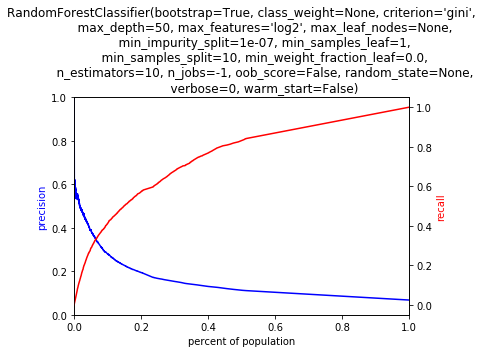

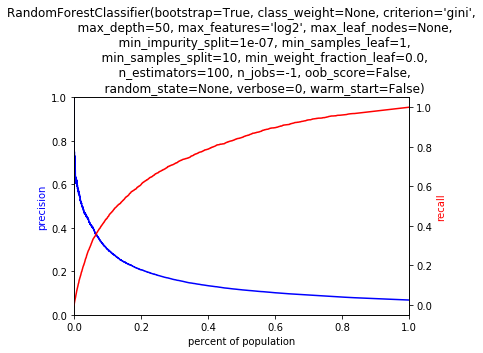

DT


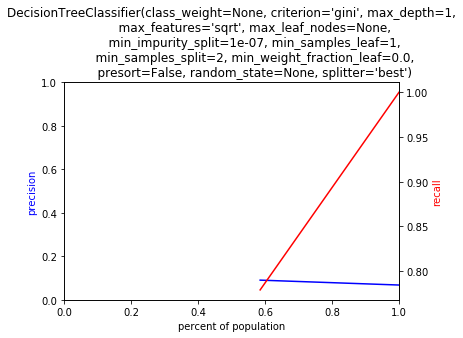

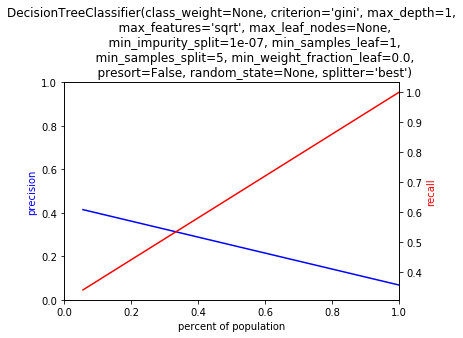

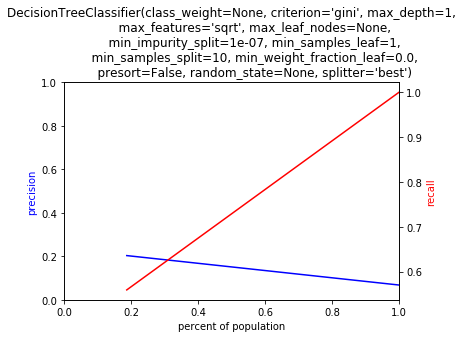

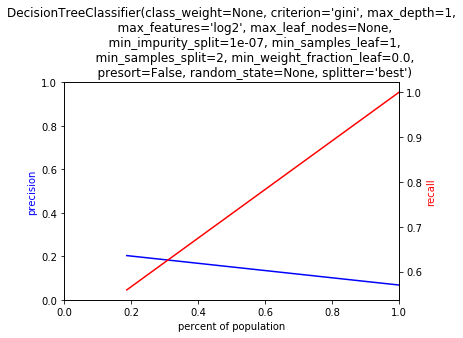

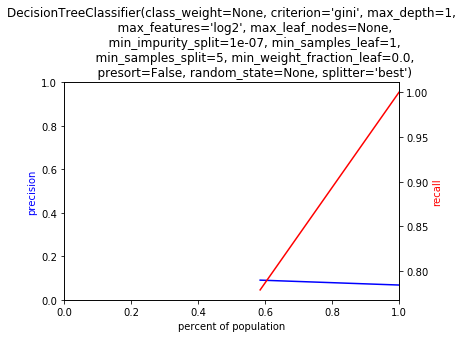

...

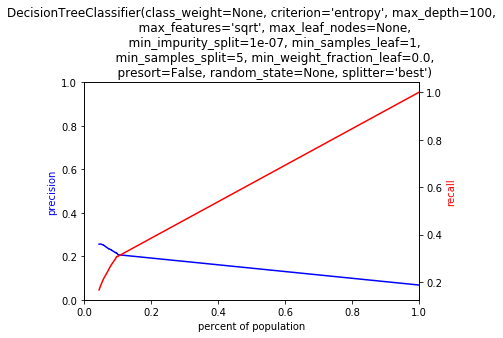

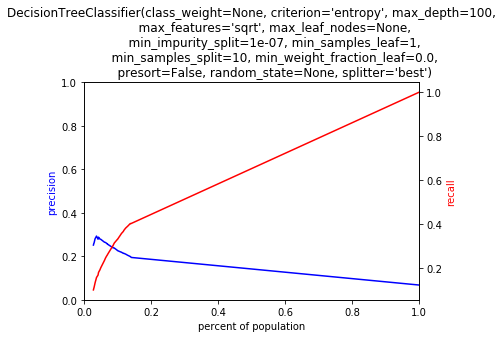

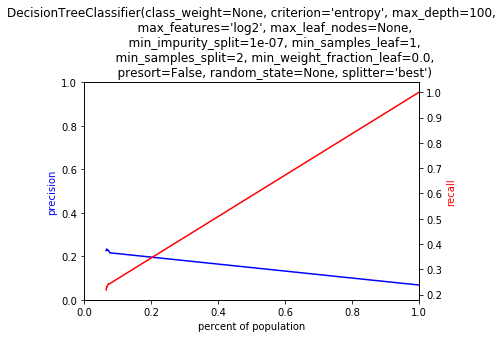

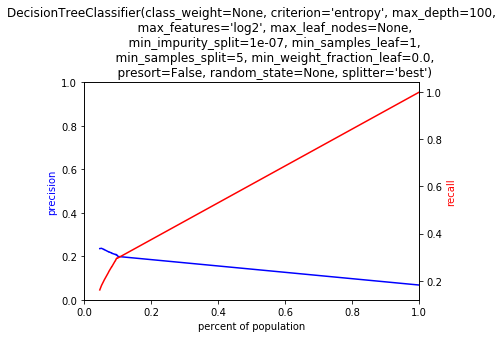

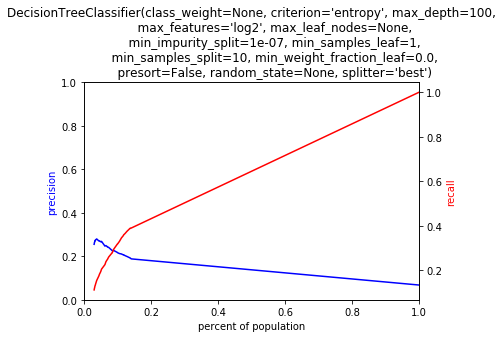

KNN


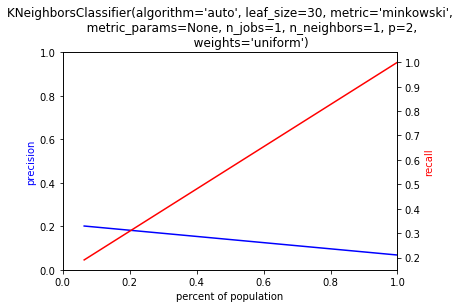

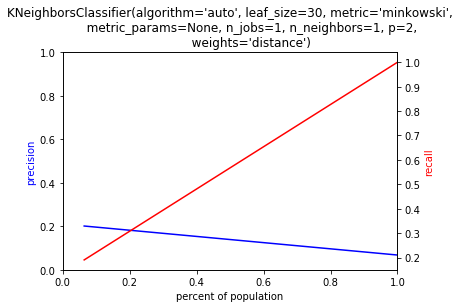

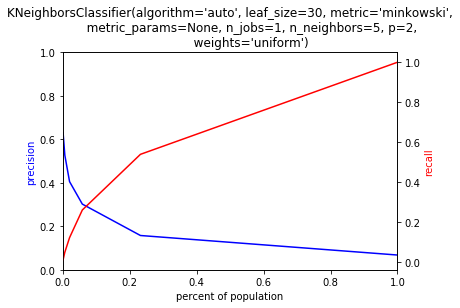

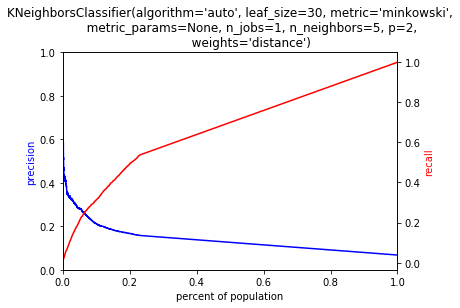

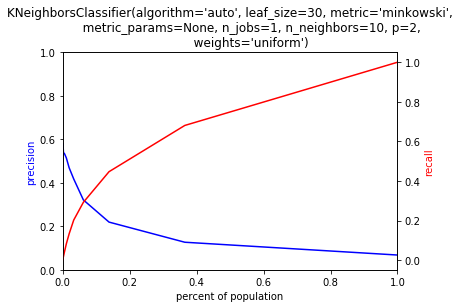

...

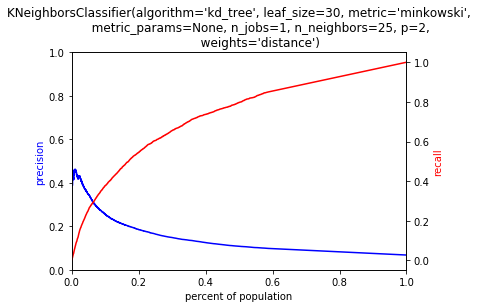

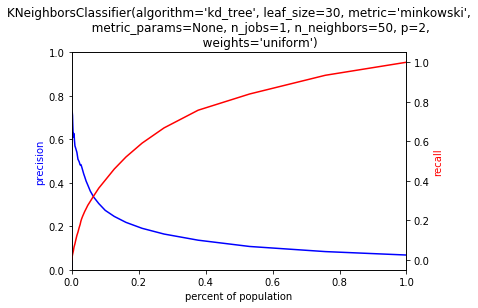

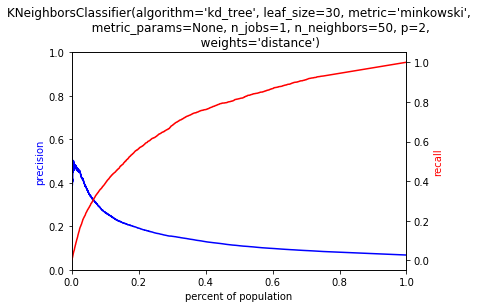

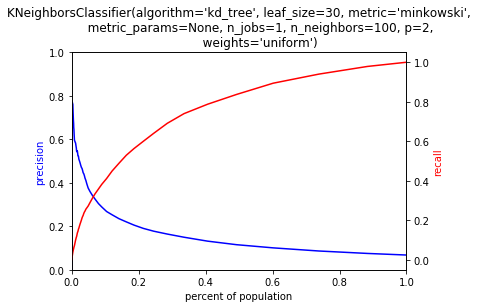

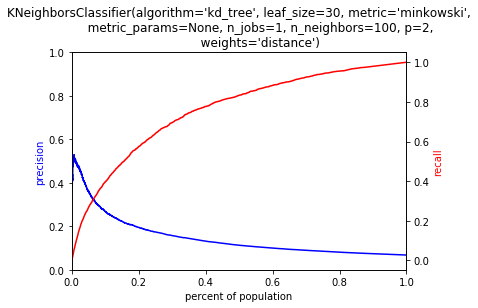

ET


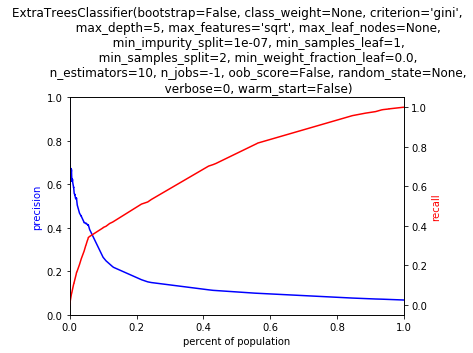

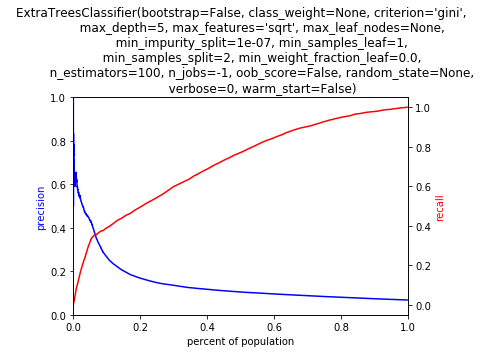

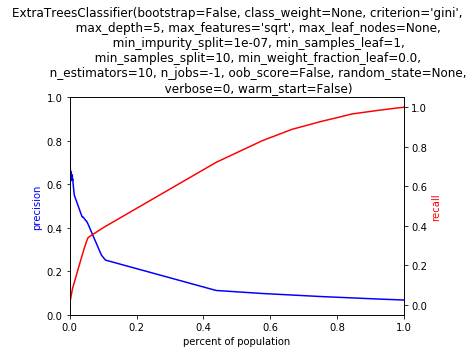

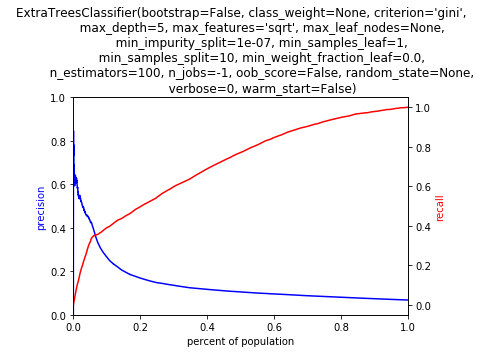

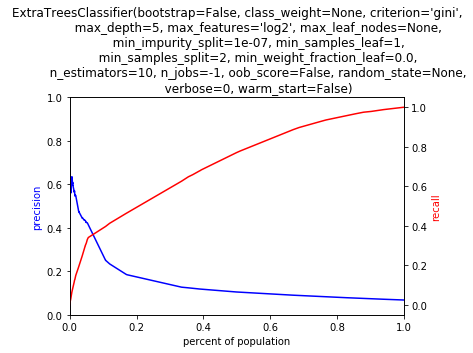

...

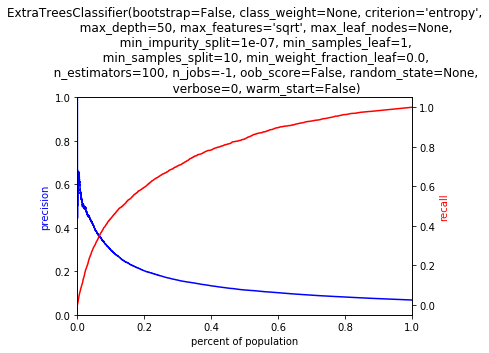

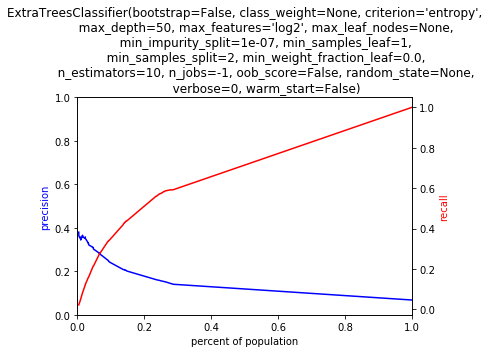

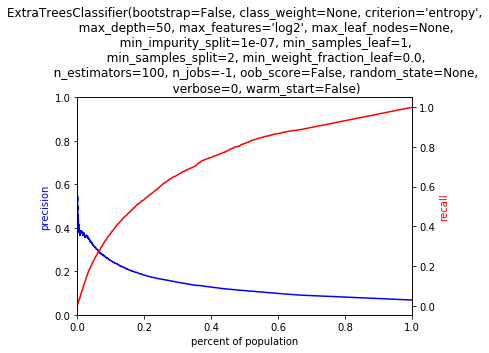

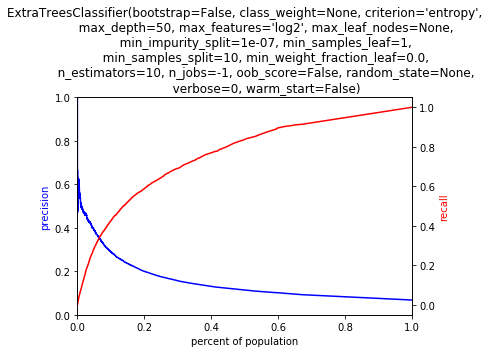

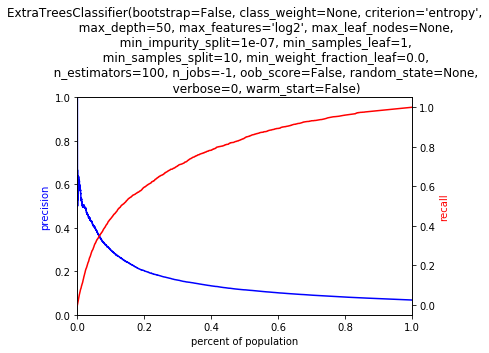

AB


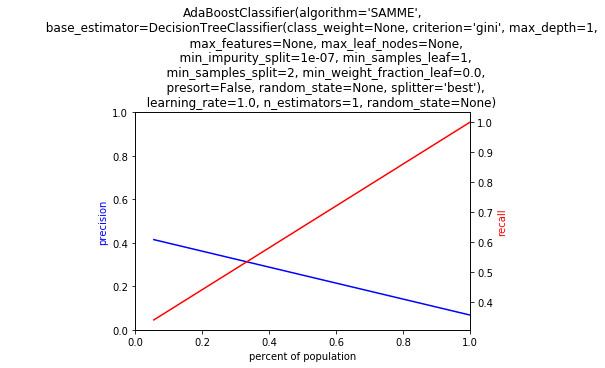

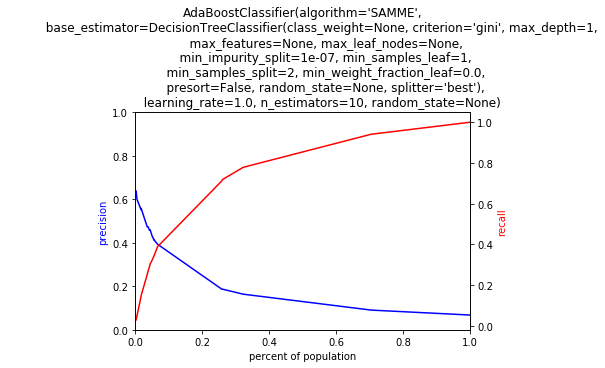

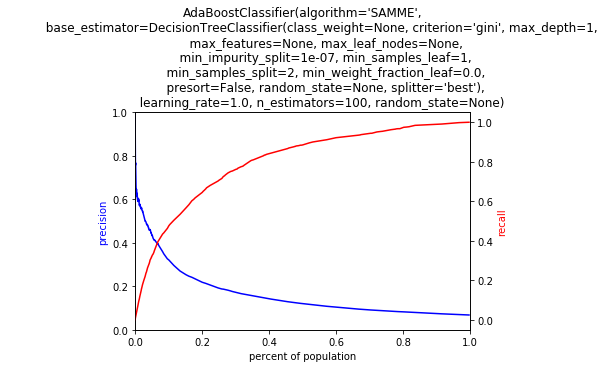

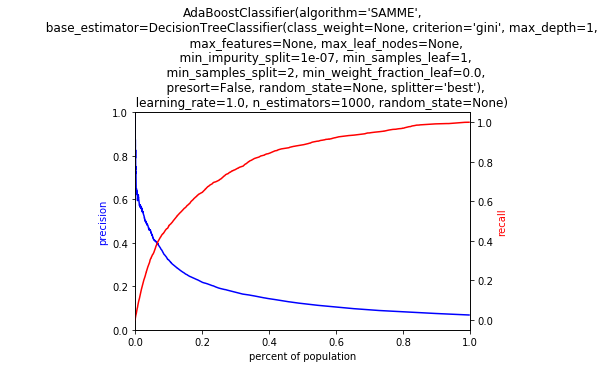

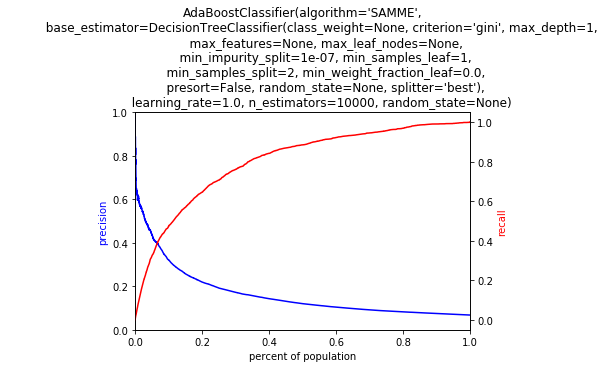

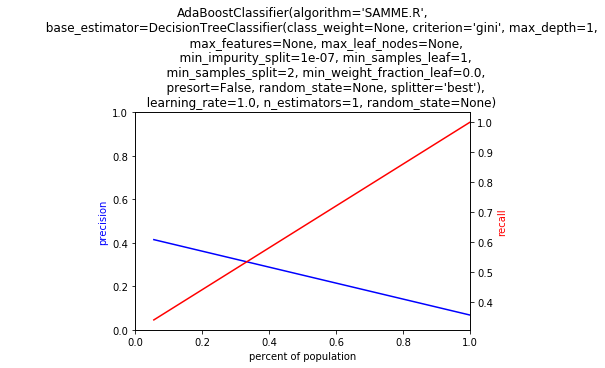

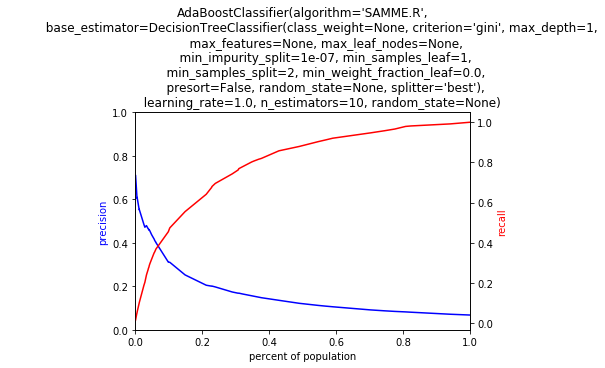

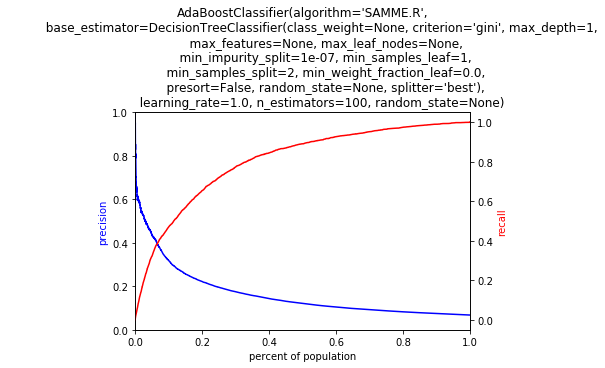

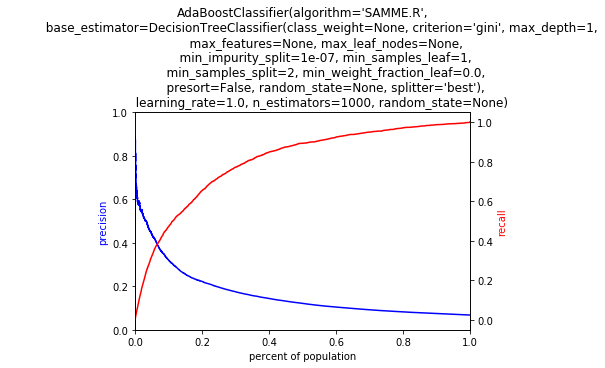

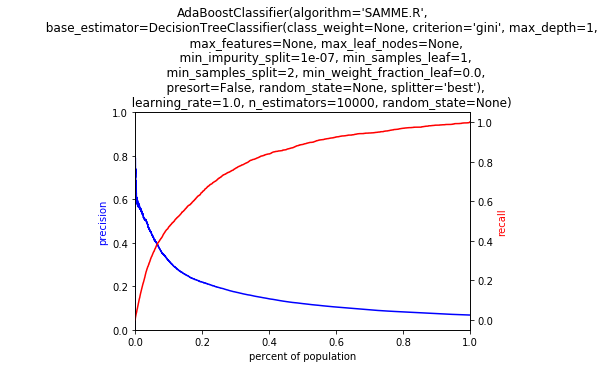

GB


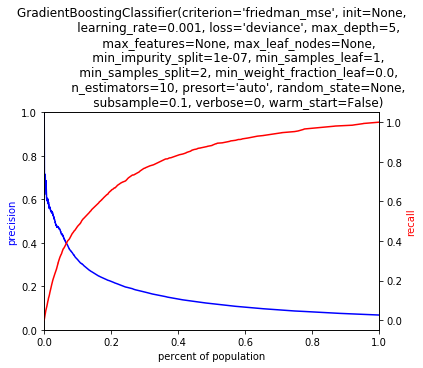

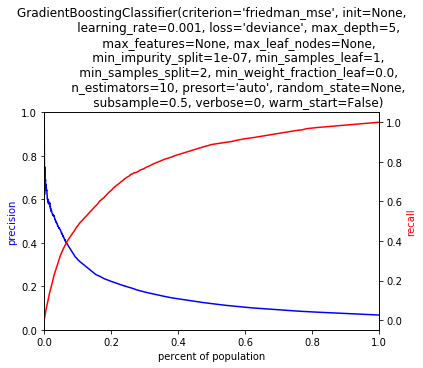

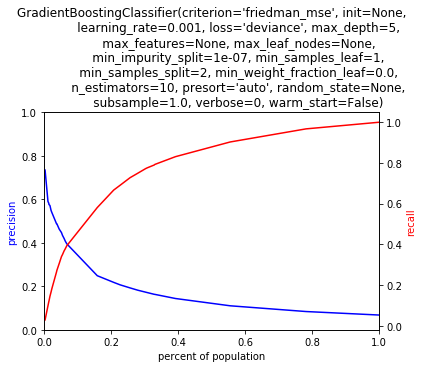

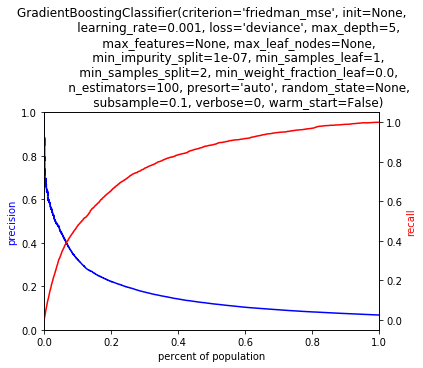

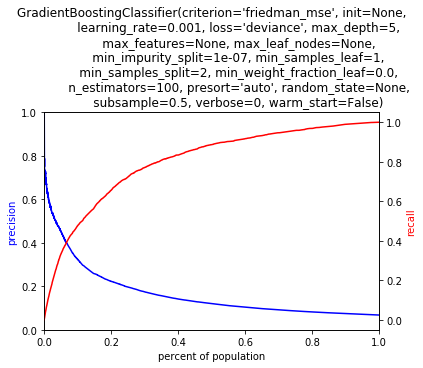

...

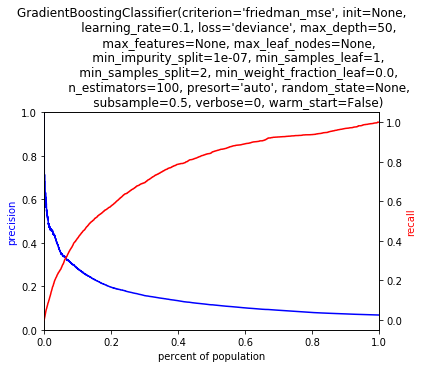

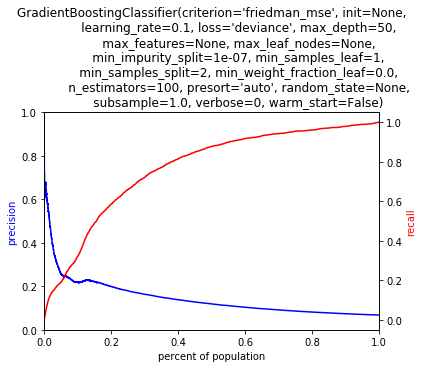

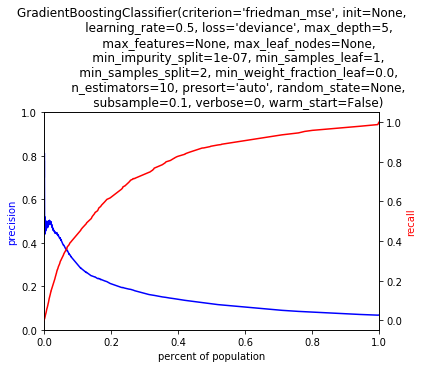

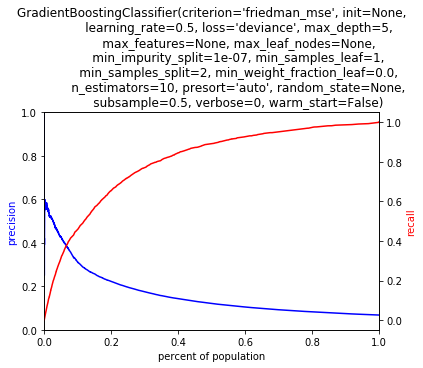

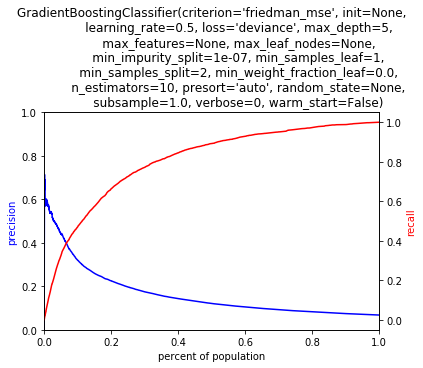

/Users/zhuoleng/anaconda/lib/python3.5/site-packages/sklearn/ensemble/gradient_boosting.py:1093: RuntimeWarning: invalid value encountered in double_scalars
  sample_weight[~sample_mask]))


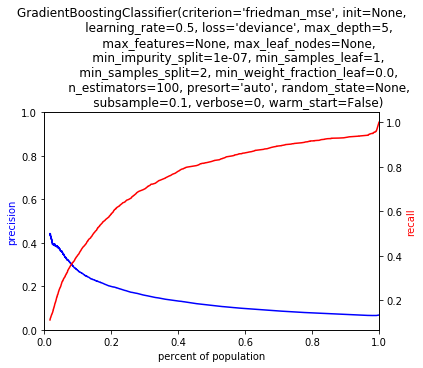

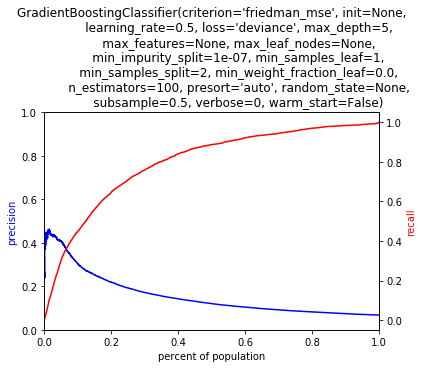

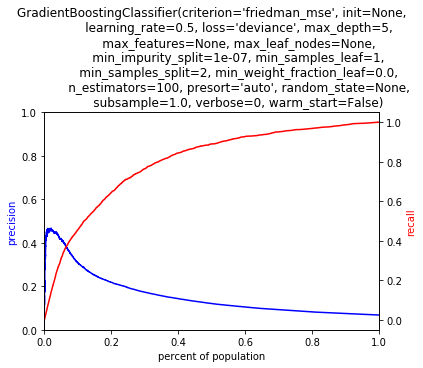

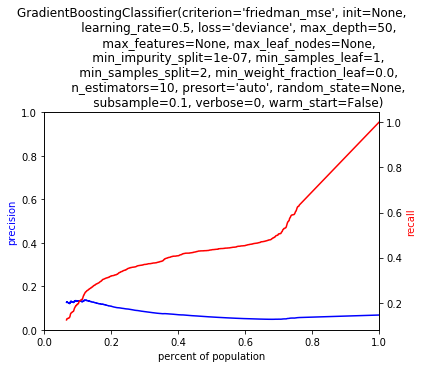

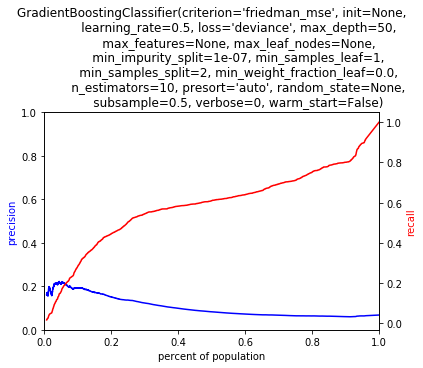

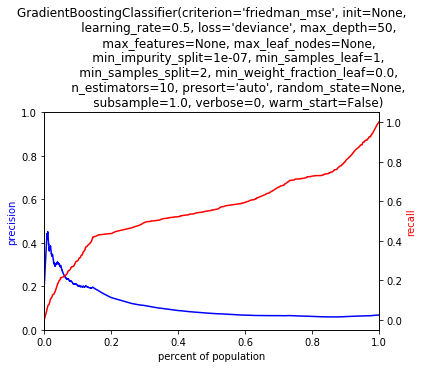

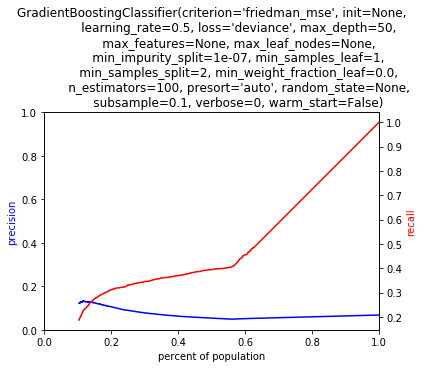

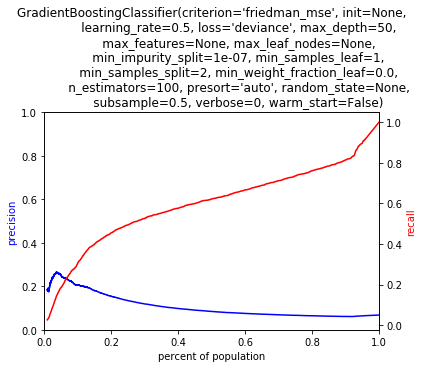

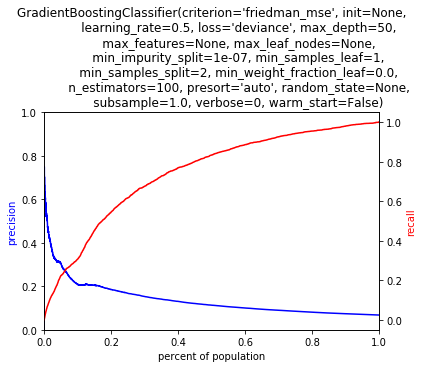

LR


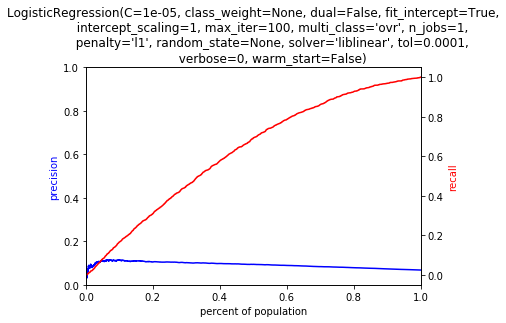

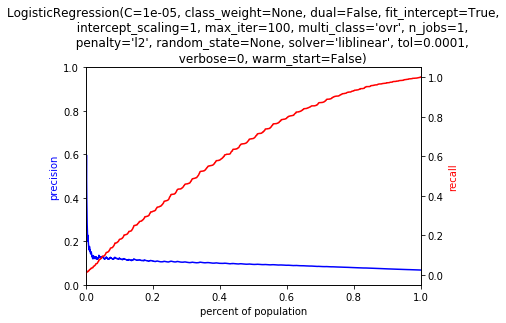

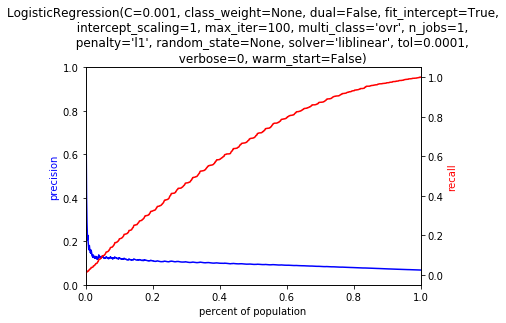

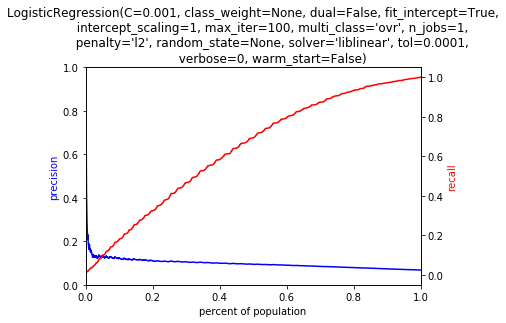

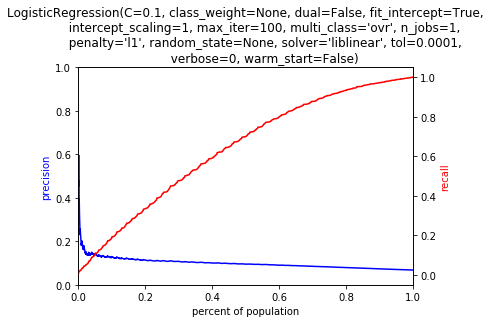

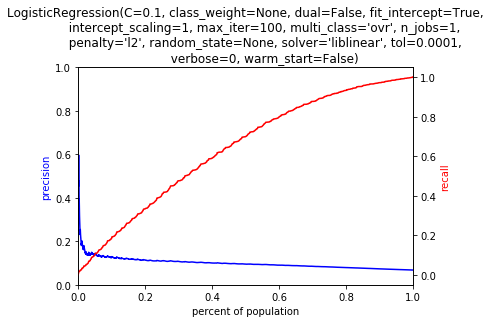

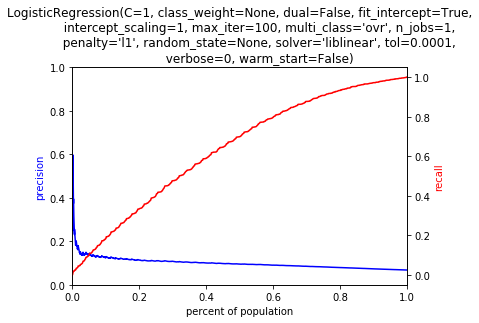

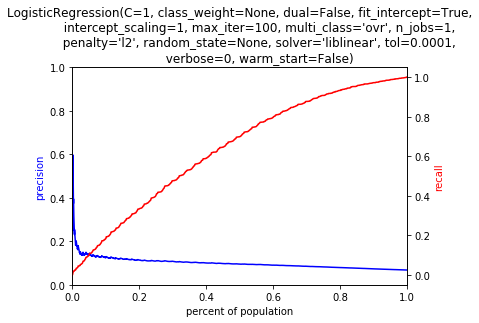

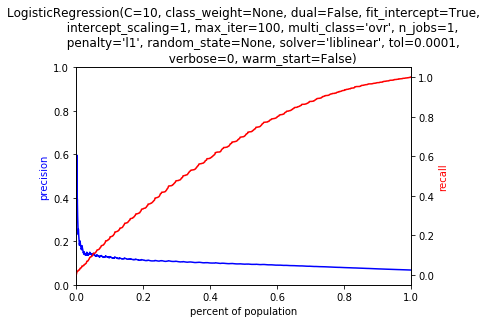

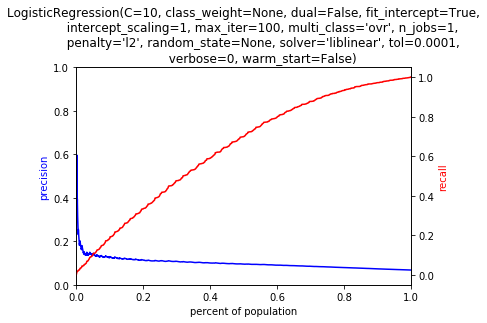

NB


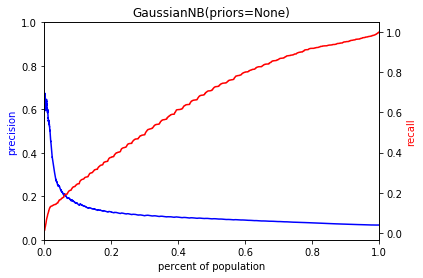

In [32]:
grid_size = 'small'
clfs, grid = ClassifierEvaluation4.define_clfs_params(grid_size)
models_to_run=['RF','DT','KNN', 'ET', 'AB', 'GB', 'LR', 'NB']

X = df[features]
y = df.SeriousDlqin2yrs
results_df = ClassifierEvaluation6.clf_loop(models_to_run, clfs, grid, X,y)

In [35]:
results_df.to_csv('results.csv', index=False)